In [1]:
#!pip install datasets

In [2]:
#!pip install sentence_transformers

In [3]:
# Load data from huggingface
from datasets import load_dataset
dataset = load_dataset("maartengr/arxiv_nlp")

In [4]:
# Extract specific metadata
titles = dataset['train']['Titles']
abstracts = dataset['train']["Abstracts"]
years = dataset['train']["Years"]
categories = dataset['train']["Categories"]


In [5]:
from sentence_transformers import SentenceTransformer

# We load our model
embedding_model = SentenceTransformer('all-MiniLM-L6-v2')

# The abstracts are converted to vector representations
embeddings = embedding_model.encode(abstracts)

In [6]:
#!pip install hdbscan

In [7]:
#!pip3 uninstall umap

In [8]:
!pip install umap-learn

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com



[notice] A new release of pip available: 22.3.1 -> 23.2.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [9]:
import umap.umap_ as UMAP

# We instantiate our UMAP model
umap_model = UMAP.UMAP(n_neighbors=15, n_components=5, min_dist=0.0, metric='cosine')

# We fit and transform our embeddings to reduce them
reduced_embeddings = umap_model.fit_transform(embeddings)

C:\Users\nikhi\AppData\Local\Programs\Python\Python310\lib\site-packages\umap\distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
C:\Users\nikhi\AppData\Local\Programs\Python\Python310\lib\site-packages\umap\distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
C:\Users\nikhi\AppData\Local\Programs\Python\Python3

In [10]:
from hdbscan import HDBSCAN

# We instantiate our HDBSCAN model
hdbscan_model = HDBSCAN(min_cluster_size=15, metric='euclidean', cluster_selection_method='eom')

# We fit our model and extract the cluster labels
hdbscan_model.fit(reduced_embeddings)
labels = hdbscan_model.labels_

<Axes: xlabel='x', ylabel='y'>

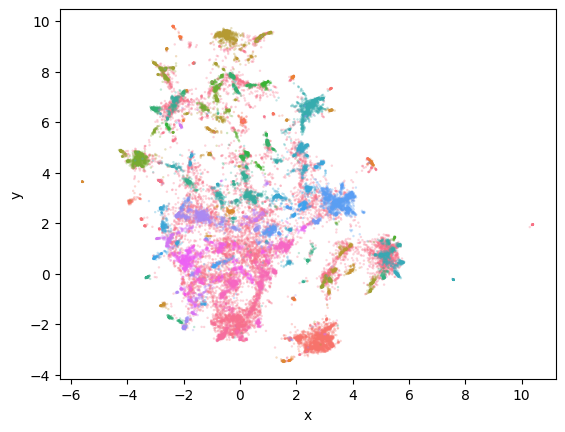

In [11]:
import seaborn as sns
import pandas as pd
import numpy as np
# Reduce 384-dimensional embeddings to 2 dimensions for easier visualization
reduced_embeddings = UMAP.UMAP(n_neighbors=15, n_components=2,
min_dist=0.0, metric='cosine').fit_transform(embeddings)
df = pd.DataFrame(np.hstack([reduced_embeddings, labels.reshape(-1, 1)]),
     columns=["x", "y", "cluster"]).sort_values("cluster")

# Visualize clusters
df.cluster = df.cluster.astype(int).astype(str)
sns.scatterplot(data=df, x='x', y='y', hue='cluster',
   linewidth=0, legend=False, s=3, alpha=0.3)

In [12]:
for index in np.where(labels==14)[0][:3]:
  print(abstracts[index])

  We take the generation of Chinese classical poem lines as a
sequence-to-sequence learning problem, and build a novel system based on the
RNN Encoder-Decoder structure to generate quatrains (Jueju in Chinese), with a
topic word as input. Our system can jointly learn semantic meaning within a
single line, semantic relevance among lines in a poem, and the use of
structural, rhythmical and tonal patterns, without utilizing any constraint
templates. Experimental results show that our system outperforms other
competitive systems. We also find that the attention mechanism can capture the
word associations in Chinese classical poetry and inverting target lines in
training can improve performance.

  Learning and generating Chinese poems is a charming yet challenging task.
Traditional approaches involve various language modeling and machine
translation techniques, however, they perform not as well when generating poems
with complex pattern constraints, for example Song iambics, a famous type 

In [13]:
#!pip install distributed
#!pip install bertopic

In [14]:
#!pip3 uninstall umap
#!pip3 install umap-learn

In [15]:
import umap.umap_ as UMAP
from hdbscan import HDBSCAN
from sentence_transformers import SentenceTransformer
from sklearn.feature_extraction.text import CountVectorizer

from bertopic import BERTopic
from bertopic.representation import KeyBERTInspired
from bertopic.vectorizers import ClassTfidfTransformer

In [16]:
# Step 1 - Extract embeddings (blue block)
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")

# Step 2 - Reduce dimensionality (red block)
umap_model = UMAP.UMAP(n_neighbors=15, n_components=5, min_dist=0.0, metric='cosine')

# Step 3 - Cluster reduced embeddings (green block)
hdbscan_model = HDBSCAN(min_cluster_size=15, metric='euclidean', cluster_selection_method='eom', prediction_data=True)

# Step 4 - Tokenize topics (yellow block)
vectorizer_model = CountVectorizer(stop_words="english")

# Step 5 - Create topic representation (grey block)
ctfidf_model = ClassTfidfTransformer()

# Step 6 - (Optional) Fine-tune topic representations with
# a `bertopic.representation` model (purple block)
representation_model = KeyBERTInspired()
# Combine the steps and build our own topic model
topic_model = BERTopic(
  embedding_model=embedding_model,          # Step 1 - Extract embeddings
  umap_model=umap_model,                    # Step 2 - Reduce dimensionality
  hdbscan_model=hdbscan_model,              # Step 3 - Cluster reduced embeddings
  vectorizer_model=vectorizer_model,        # Step 4 - Tokenize topics
  ctfidf_model=ctfidf_model,                # Step 5 - Extract topic words
  representation_model=representation_model # Step 6 - Fine-tune topics
)

In [17]:
#!pip install datasets
# Load data from huggingface
from datasets import load_dataset
dataset = load_dataset("maartengr/arxiv_nlp")

In [18]:
# Extract specific metadata
abstracts = dataset['train']["Abstracts"]
years = dataset['train']["Years"]
categories = dataset['train']["Categories"]
titles = dataset['train']["Titles"]

In [19]:
# Train our topic model in only three lines of code
from bertopic import BERTopic

topic_model = BERTopic()
topics, probs = topic_model.fit_transform(abstracts)

In [20]:
import umap.umap_ as UMAP
from bertopic import BERTopic

# Using a custom UMAP model
umap_model = UMAP.UMAP(n_neighbors=15, n_components=5, min_dist=0.0, metric='cosine', random_state=42)

# Train our model
topic_model = BERTopic(umap_model=umap_model)
topics, probs = topic_model.fit_transform(abstracts)

In [21]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,11276,-1_of_to_the_and,"[of, to, the, and, we, in, that, language, for...",[ Semantic sentence embedding models encode n...
1,0,1925,0_speech_asr_recognition_acoustic,"[speech, asr, recognition, acoustic, endtoend,...",[ This paper presents a method to train end-t...
2,1,874,1_clinical_medical_biomedical_notes,"[clinical, medical, biomedical, notes, patient...",[ Clinical text provides essential informatio...
3,2,664,2_hate_offensive_detection_speech,"[hate, offensive, detection, speech, toxic, so...",[ Hate speech detection has become a hot topi...
4,3,657,3_parsing_parser_dependency_amr,"[parsing, parser, dependency, amr, parsers, tr...",[ Constituent and dependency representation f...
...,...,...,...,...,...
300,299,10,299_labeling_weak_labels_soft,"[labeling, weak, labels, soft, supervision, la...",[ Despite rapid developments in the field of ...
301,300,10,300_normalization_itn_tn_nsws,"[normalization, itn, tn, nsws, bertbigrucrf, e...",[ While there have been several contributions...
302,301,10,301_suicidal_ideation_suicide_mental,"[suicidal, ideation, suicide, mental, risk, so...",[ Mental health is a critical issue in modern...
303,302,10,302_domain_adaptation_qa_question,"[domain, adaptation, qa, question, qc, kgsqa, ...",[ Question generation has recently shown impr...


In [22]:
topic_model.get_topic(2)

[('hate', 0.026250245174214495),
 ('offensive', 0.01756030849825384),
 ('detection', 0.010257032484039131),
 ('speech', 0.010091028236580995),
 ('toxic', 0.009885376321803212),
 ('social', 0.009130702953827712),
 ('abusive', 0.008875652271029183),
 ('content', 0.00827732847446226),
 ('toxicity', 0.008018163059969295),
 ('media', 0.00790543633009604)]

In [23]:
topic_model.find_topics("topic modeling")

([14, 51, 157, 258, 196],
 [0.76855946, 0.51336926, 0.4650873, 0.4584748, 0.45529467])

In [24]:
topic_model.get_topic(13)

[('mt', 0.021329578044510685),
 ('qe', 0.020989767743806103),
 ('translation', 0.019280096585183076),
 ('postediting', 0.013698218758930727),
 ('ape', 0.013428659636235093),
 ('quality', 0.01288804975447976),
 ('translations', 0.011004176162246361),
 ('machine', 0.010034326681643248),
 ('metrics', 0.00964164949765224),
 ('human', 0.009260591598025404)]

In [25]:
topics[titles.index('BERTopic: Neural topic modeling with a class-based TF-IDF procedure')]

14

In [26]:
index = titles.index('BERTopic: Neural topic modeling with a class-based TF-IDF procedure')

# Calculate the topic distributions on a token-level
topic_distr, topic_token_distr = topic_model.approximate_distribution(abstracts[index][:90], calculate_tokens=True)
df = topic_model.visualize_approximate_distribution(abstracts[index][:90], topic_token_distr[0])
df

,Topic,models,can,be,useful,tools,to,discover,latent,topics,in,collections,of,documents
14_topic_topics_lda_latent,0.595,0.595,0.595,0.595,0.000,0.100,0.381,0.662,0.950,1.096,0.936,0.655,0.367,0.121
51_tweets_hashtag_twitter_social,0.108,0.108,0.108,0.108,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
69_annotation_tools_formats_xml,0.000,0.000,0.187,0.372,0.499,0.619,0.432,0.247,0.120,0.000,0.000,0.000,0.000,0.000
88_layout_document_documents_extraction,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.114,0.114,0.114,0.114
230_latent_variational_variables_responses,0.000,0.000,0.000,0.000,0.000,0.169,0.343,0.516,0.662,0.493,0.320,0.146,0.000,0.000
251_african_languages_afrolid_kencorpus,0.000,0.000,0.152,0.304,0.410,0.410,0.258,0.106,0.000,0.000,0.000,0.000,0.000,0.000
276_emm_collections_media_mining,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.161,0.340,0.563,0.563,0.403,0.223


In [27]:
topic_model.visualize_topics()

In [28]:
# Visualize a selection of topics and documents
topic_model.visualize_documents(titles,
      topics=[0, 1, 2, 3, 4, 6, 7, 10, 12,
 13, 16, 33, 40, 45, 46, 65])

In [29]:
topic_model.visualize_barchart(topics=list(range(50, 58, 1)))

In [30]:
# Save original representations
from copy import deepcopy
original_topics = deepcopy(topic_model.topic_representations_)

In [31]:
def topic_differences(model, original_topics, max_length=75, nr_topics=10):
  """ For the first 10 topics, show the differences in
  topic representations between two models """
  for topic in range(nr_topics):

    # Extract top 5 words per topic per model
    og_words = " | ".join(list(zip(*original_topics[topic]))[0][:5])
    new_words = " | ".join(list(zip(*model.get_topic(topic)))[0][:5])

    # Print a 'before' and 'after'
    whitespaces = " " * (max_length - len(og_words))
    print(f"Topic: {topic}    {og_words}{whitespaces}-->     {new_words}")

In [32]:
!pip install bertopic[spacy]

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com



[notice] A new release of pip available: 22.3.1 -> 23.2.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [33]:
# Part-of-Speech tagging
import en_core_web_sm
representation_model = en_core_web_sm.load()
#from bertopic.representation import PartOfSpeech
#representation_model = PartOfSpeech("en_core_web_sm")

# Use the representation model in BERTopic on top of the default pipeline
topic_model.update_topics(abstracts, representation_model=representation_model)

# Show topic differences
topic_differences(topic_model, original_topics)

Topic: 0    speech | asr | recognition | acoustic | endtoend                           -->     speech | asr | recognition | acoustic | endtoend
Topic: 1    clinical | medical | biomedical | notes | patient                          -->     clinical | medical | biomedical | notes | patient
Topic: 2    hate | offensive | detection | speech | toxic                              -->     hate | offensive | detection | speech | toxic
Topic: 3    parsing | parser | dependency | amr | parsers                              -->     parsing | parser | dependency | amr | parsers
Topic: 4    summarization | summaries | summary | abstractive | extractive             -->     summarization | summaries | summary | abstractive | extractive
Topic: 5    generation | nlg | text | metrics | latent                                 -->     generation | nlg | text | metrics | latent
Topic: 6    gender | bias | biases | debiasing | fairness                              -->     gender | bias | biases | debiasing | f

In [34]:
# Maximal Marginal Relevance
from bertopic.representation import MaximalMarginalRelevance
representation_model = MaximalMarginalRelevance(diversity=0.5)

# Use the representation model in BERTopic on top of the default pipeline
topic_model.update_topics(abstracts, representation_model=representation_model)

# Show topic differences
topic_differences(topic_model, original_topics)

Topic: 0    speech | asr | recognition | acoustic | endtoend                           -->     asr | endtoend | audio | error | rate
Topic: 1    clinical | medical | biomedical | notes | patient                          -->     biomedical | notes | extraction | records | ehr
Topic: 2    hate | offensive | detection | speech | toxic                              -->     speech | abusive | toxicity | hateful | platforms
Topic: 3    parsing | parser | dependency | amr | parsers                              -->     amr | parsers | treebank | syntactic | constituent
Topic: 4    summarization | summaries | summary | abstractive | extractive             -->     summarization | extractive | multidocument | sentences | factual
Topic: 5    generation | nlg | text | metrics | latent                                 -->     nlg | metrics | datatotext | variational | decoding
Topic: 6    gender | bias | biases | debiasing | fairness                              -->     bias | debiasing | fairness | s

In [35]:
from transformers import pipeline
from bertopic.representation import TextGeneration

# Text2Text Generation with Flan-T5
generator = pipeline('text2text-generation', model='google/flan-t5-xl')
representation_model = TextGeneration(generator)

# Use the representation model in BERTopic on top of the default pipeline
topic_model.update_topics(abstracts, representation_model=representation_model)

# Show topic differences
topic_differences(topic_model, original_topics)

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Topic: 0    speech | asr | recognition | acoustic | endtoend                           -->     automatic speech recognition |  |  |  | 
Topic: 1    clinical | medical | biomedical | notes | patient                          -->     extract medical information from text |  |  |  | 
Topic: 2    hate | offensive | detection | speech | toxic                              -->     hate speech detection |  |  |  | 
Topic: 3    parsing | parser | dependency | amr | parsers                              -->     treebanks |  |  |  | 
Topic: 4    summarization | summaries | summary | abstractive | extractive             -->     automatic generation of summary documents from text |  |  |  | 
Topic: 5    generation | nlg | text | metrics | latent                                 -->     generative models |  |  |  | 
Topic: 6    gender | bias | biases | debiasing | fairness                              -->     language and gender bias |  |  |  | 
Topic: 7    prompt | fewshot | prompts | incontext | tuni